In [ ]:
'''LR1 → Conv Block 1 → F1 ┐
                        │
                        ├─ Fusion Block (ESA, attention, or concat) → SR Backbone (EDSR, RCAN) → HR Output
                        │
LR2 → Conv Block 2 → F2 ┘
'''

'LR1 → Conv Block 1 → F1 ┐\n                        │\n                        ├─ Fusion Block (ESA, attention, or concat) → SR Backbone (EDSR, RCAN) → HR Output\n                        │\nLR2 → Conv Block 2 → F2 ┘\n'

In [ ]:
pip install torch torchvision


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
class SRCNNExtractor(nn.Module):
    def __init__(self, in_channels=1, out_channels=32):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=9, padding=4),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)


In [ ]:
class FusionBlock(nn.Module):
    def __init__(self, in_channels=64, out_channels=32):  # 32+32 → 64 → 32
        super().__init__()
        self.fuse = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, f1, f2):
        fused = torch.cat([f1, f2], dim=1)
        return self.fuse(fused)


In [ ]:
class ReconstructionBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.reconstruct = nn.Sequential(
            nn.Conv2d(32, 16, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 1, kernel_size=5, padding=2)  # final 1-channel output
        )

    def forward(self, x):
        return self.reconstruct(x)


In [ ]:
import torch
import torch.nn as nn

class SRCNNExtractor(nn.Module):
    def __init__(self, in_channels=1, out_channels=32):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=9, padding=4),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class FusionBlock(nn.Module):
    def __init__(self, in_channels=64, out_channels=32):
        super().__init__()
        self.fuse = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, f1, f2):
        fused = torch.cat([f1, f2], dim=1)
        return self.fuse(fused)

class ReconstructionBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.reconstruct = nn.Sequential(
            nn.Conv2d(32, 16, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 1, kernel_size=5, padding=2)
        )

    def forward(self, x):
        return self.reconstruct(x)

class DualSRCNN(nn.Module):
    def __init__(self, in_channels=1):
        super().__init__()
        self.conv1 = SRCNNExtractor(in_channels, 32)
        self.conv2 = SRCNNExtractor(in_channels, 32)
        self.fusion = FusionBlock(in_channels=64, out_channels=32)
        self.reconstruction = ReconstructionBlock()

    def forward(self, lr1, lr2):
        f1 = self.conv1(lr1)
        f2 = self.conv2(lr2)
        fused = self.fusion(f1, f2)
        out = self.reconstruction(fused)
        return out


In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class DualImageSRDataset(Dataset):
    def __init__(self, root_dir, hr_image_size=(256, 256), transform=None):
        """
        Args:
            root_dir (str): path to 'dual_sr_dataset' folder
            hr_image_size (tuple): Desired final size for LR and HR images
        """
        self.lr_dir = os.path.join(root_dir, "low_res")
        self.hr_dir = os.path.join(root_dir, "high_res")
        self.hr_image_size = hr_image_size

        # Get base names
        self.filenames = sorted([
            fname.replace("_LR0.png", "")
            for fname in os.listdir(self.lr_dir)
            if fname.endswith("_LR0.png")
        ])

        # Shared transform (both LR and HR must match size for SRCNN)
        self.to_tensor = transforms.ToTensor()
        self.resize = transforms.Resize(hr_image_size, interpolation=transforms.InterpolationMode.BICUBIC)

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        base = self.filenames[idx]

        lr1_path = os.path.join(self.lr_dir, f"{base}_LR0.png")
        lr2_path = os.path.join(self.lr_dir, f"{base}_LR1.png")
        hr_path  = os.path.join(self.hr_dir,  f"{base}_HR.png")

        # Load and resize all to same size
        lr1 = self.to_tensor(self.resize(Image.open(lr1_path).convert('L')))
        lr2 = self.to_tensor(self.resize(Image.open(lr2_path).convert('L')))
        hr  = self.to_tensor(self.resize(Image.open(hr_path).convert('L')))

        return {
            "lr1": lr1,
            "lr2": lr2,
            "hr": hr
        }


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
device

device(type='cuda')

In [ ]:
!unzip dual_sr_dataset.zip -d /content/dual_sr_dataset

Archive:  dual_sr_dataset.zip
   creating: /content/dual_sr_dataset/dual_sr_dataset/
   creating: /content/dual_sr_dataset/dual_sr_dataset/train/
   creating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0594_LR0.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0594_LR1.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0595_LR0.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0595_LR1.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0597_LR1.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0598_LR0.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0599_LR1.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgset0600_LR0.png  
  inflating: /content/dual_sr_dataset/dual_sr_dataset/train/low_res/imgse

In [ ]:
import torch.nn.functional as F
import math

def calculate_psnr(sr, hr, max_val=1.0):
    mse = F.mse_loss(sr, hr).item()  # Convert tensor → float
    if mse == 0:
        return 100.0
    psnr = 20 * math.log10(max_val / math.sqrt(mse))
    return psnr


In [ ]:
from torch.utils.data import DataLoader

# Datasets
train_ds = DualImageSRDataset("/content/dual_sr_dataset/dual_sr_dataset/train")
test_ds  = DualImageSRDataset("/content/dual_sr_dataset/dual_sr_dataset/test")

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=1, shuffle=False)

# Model, Loss, Optimizer
model = DualSRCNN().to(device)
criterion = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# Training Loop
for epoch in range(1, 151):
    model.train()
    total_train_loss = 0

    for batch in train_loader:
        lr1 = batch['lr1'].to(device)
        lr2 = batch['lr2'].to(device)
        hr  = batch['hr'].to(device)

        sr = model(lr1, lr2)
        loss = criterion(sr, hr)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)

    # --- Evaluation ---
    model.eval()
    total_test_loss = 0
    total_psnr = 0

    with torch.no_grad():
        for batch in test_loader:
            lr1 = batch['lr1'].to(device)
            lr2 = batch['lr2'].to(device)
            hr  = batch['hr'].to(device)

            sr = model(lr1, lr2)
            loss = criterion(sr, hr)
            psnr = calculate_psnr(sr, hr)

            total_test_loss += loss.item()
            total_psnr += psnr

    avg_test_loss = total_test_loss / len(test_loader)
    avg_psnr = total_psnr / len(test_loader)

    print(f"[Epoch {epoch}] Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f} | PSNR: {avg_psnr:.2f} dB")


[Epoch 1] Train Loss: 0.1270 | Test Loss: 0.0807 | PSNR: 20.74 dB
[Epoch 2] Train Loss: 0.0835 | Test Loss: 0.0774 | PSNR: 21.31 dB
[Epoch 3] Train Loss: 0.0801 | Test Loss: 0.0750 | PSNR: 21.75 dB
[Epoch 4] Train Loss: 0.0787 | Test Loss: 0.0735 | PSNR: 21.97 dB
[Epoch 5] Train Loss: 0.0767 | Test Loss: 0.0727 | PSNR: 22.17 dB
[Epoch 6] Train Loss: 0.0753 | Test Loss: 0.0731 | PSNR: 22.26 dB
[Epoch 7] Train Loss: 0.0748 | Test Loss: 0.0708 | PSNR: 22.52 dB
[Epoch 8] Train Loss: 0.0732 | Test Loss: 0.0712 | PSNR: 22.49 dB
[Epoch 9] Train Loss: 0.0733 | Test Loss: 0.0704 | PSNR: 22.59 dB
[Epoch 10] Train Loss: 0.0735 | Test Loss: 0.0696 | PSNR: 22.73 dB
[Epoch 11] Train Loss: 0.0735 | Test Loss: 0.0699 | PSNR: 22.72 dB
[Epoch 12] Train Loss: 0.0731 | Test Loss: 0.0694 | PSNR: 22.74 dB
[Epoch 13] Train Loss: 0.0718 | Test Loss: 0.0711 | PSNR: 22.55 dB
[Epoch 14] Train Loss: 0.0733 | Test Loss: 0.0707 | PSNR: 22.61 dB
[Epoch 15] Train Loss: 0.0728 | Test Loss: 0.0764 | PSNR: 22.06 dB
[Epo

In [ ]:
os.makedirs("checkpoints", exist_ok=True)
best_test_loss = float('inf')


# Inside your epoch loop, after evaluation
if avg_test_loss < best_test_loss:
    best_test_loss = avg_test_loss
    torch.save(model.state_dict(), f"checkpoints/best_model_epoch_{epoch}.pt")
    print(f"✅ Model saved at epoch {epoch} with test loss {avg_test_loss:.4f}")


✅ Model saved at epoch 150 with test loss 0.0684


In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class BlindTestDataset(Dataset):
    def __init__(self, low_res_dir, transform=None):
        self.low_res_dir = low_res_dir

        # Use ToTensor if no custom transform
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.BICUBIC),
            transforms.ToTensor()
        ])

        # Extract base image IDs (like imgsetXXXX)
        self.filenames = sorted(set(
            fname.replace("_LR0.png", "").replace("_LR1.png", "")
            for fname in os.listdir(low_res_dir)
            if fname.endswith(".png") and ("_LR0" in fname or "_LR1" in fname)
        ))

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        base = self.filenames[idx]
        lr1_path = os.path.join(self.low_res_dir, f"{base}_LR0.png")
        lr2_path = os.path.join(self.low_res_dir, f"{base}_LR1.png")

        # Load images (grayscale → tensor)
        lr1 = self.transform(Image.open(lr1_path).convert('L'))
        lr2 = self.transform(Image.open(lr2_path).convert('L'))

        return {
            "lr1": lr1,
            "lr2": lr2,
            "id": base
        }


In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch
from torch.utils.data import DataLoader

def show_comparison_with_gt(model, dataloader, num_samples=3):
    model.eval()
    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            if i >= num_samples:
                break

            lr1 = batch["lr1"].to(device)
            lr2 = batch["lr2"].to(device)
            hr = batch["hr"].to(device)

            sr = model(lr1, lr2)
            sr = torch.clamp(sr, 0, 1)

            def to_numpy(t): return t.squeeze().cpu().numpy()

            lr1_np = to_numpy(lr1)
            lr2_np = to_numpy(lr2)
            hr_np = to_numpy(hr)
            sr_np = to_numpy(sr)

            titles = ["LR1", "LR2", "HR (Ground Truth)", "SR (Output)"]
            images = [lr1_np, lr2_np, hr_np, sr_np]


            fig, axs = plt.subplots(1, 4, figsize=(16, 4))
            fig.suptitle(f"Test Sample {i+1}", fontsize=14)

            for j, (img, title) in enumerate(zip(images, titles)):
                axs[j].imshow(img, cmap='gray')
                axs[j].set_title(title)
                axs[j].axis('off')

            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()


In [ ]:
model.load_state_dict(torch.load("/content/checkpoints/best_model_epoch_150.pt", map_location=device))
model.eval()

DualSRCNN(
  (conv1): SRCNNExtractor(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
      (1): ReLU(inplace=True)
    )
  )
  (conv2): SRCNNExtractor(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
      (1): ReLU(inplace=True)
    )
  )
  (fusion): FusionBlock(
    (fuse): Sequential(
      (0): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
      (1): ReLU(inplace=True)
    )
  )
  (reconstruction): ReconstructionBlock(
    (reconstruct): Sequential(
      (0): Conv2d(32, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ReLU(inplace=True)
      (2): Conv2d(16, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
  )
)

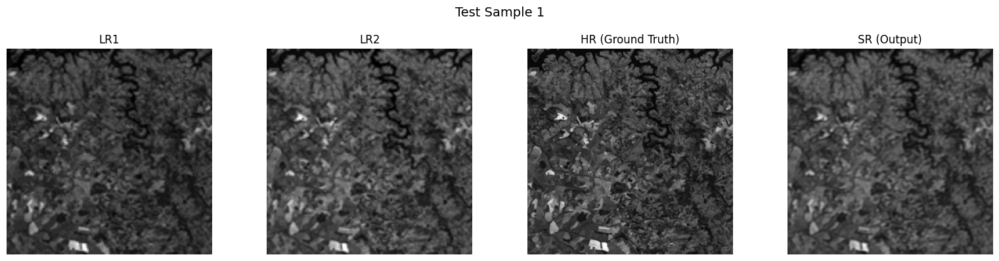

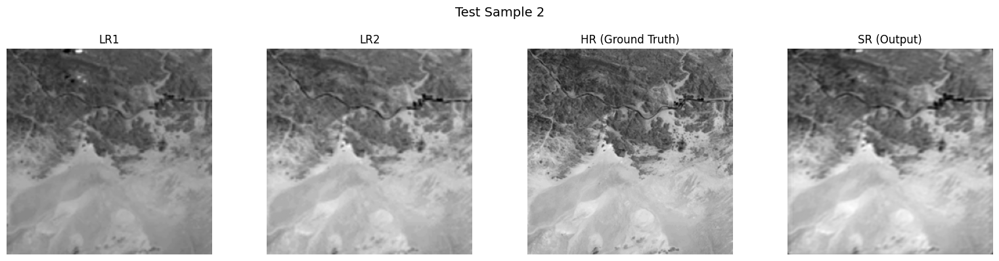

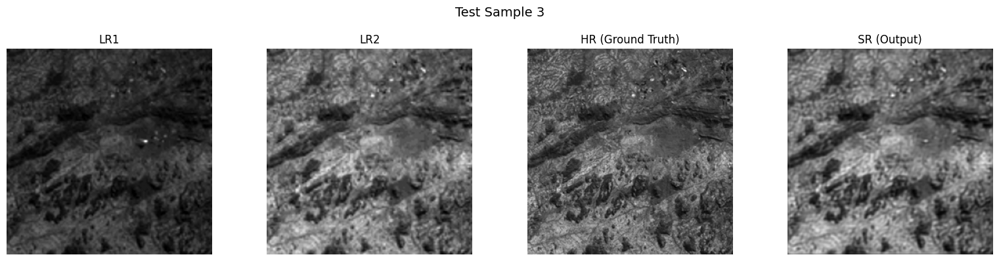

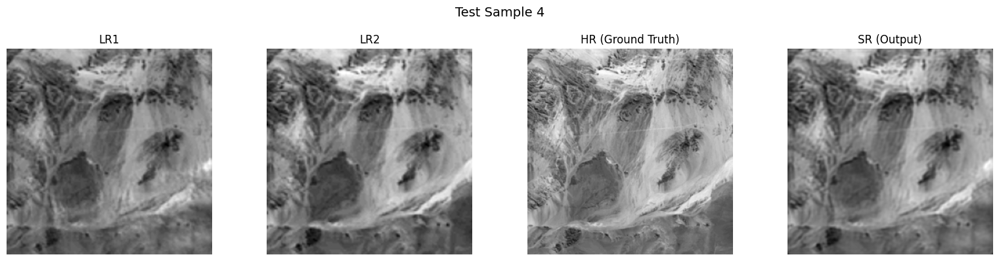

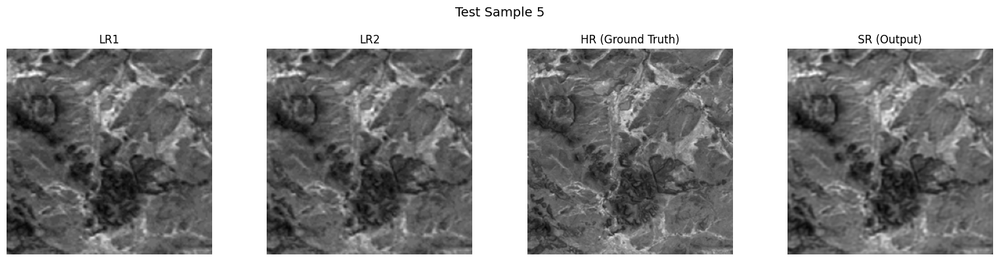

...

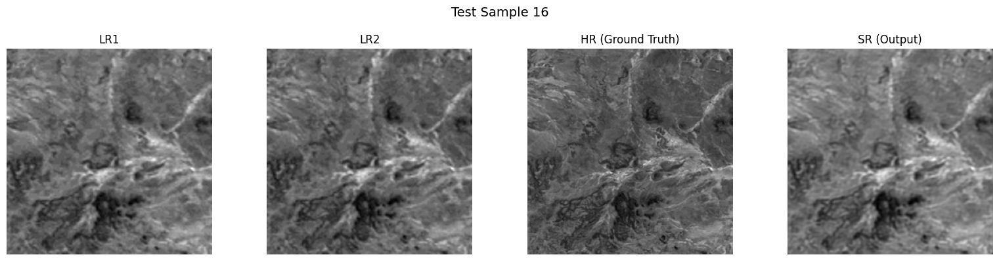

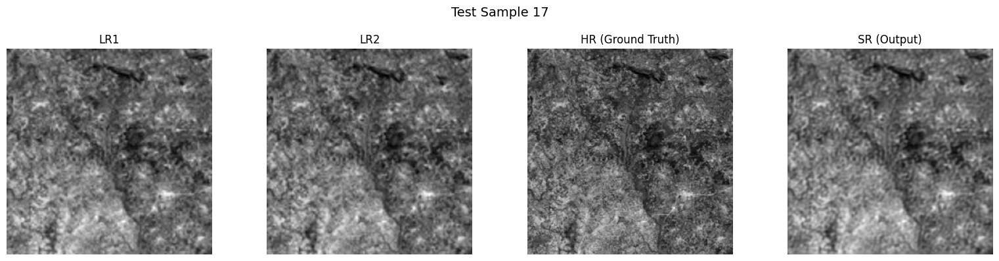

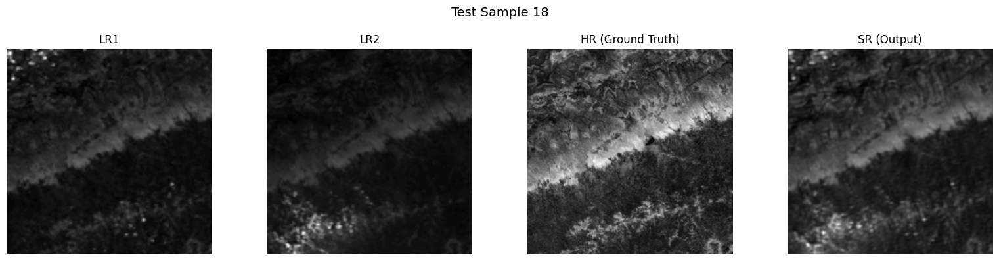

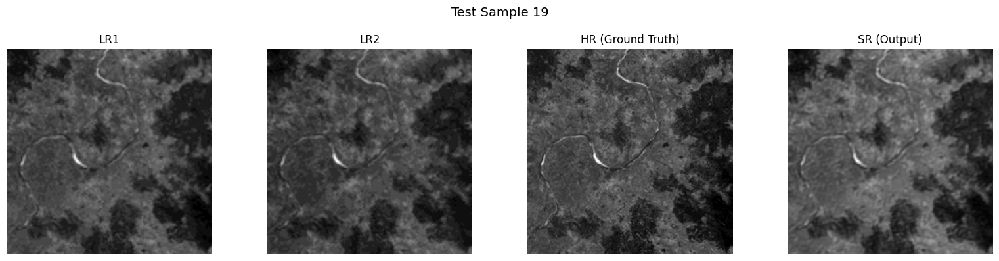

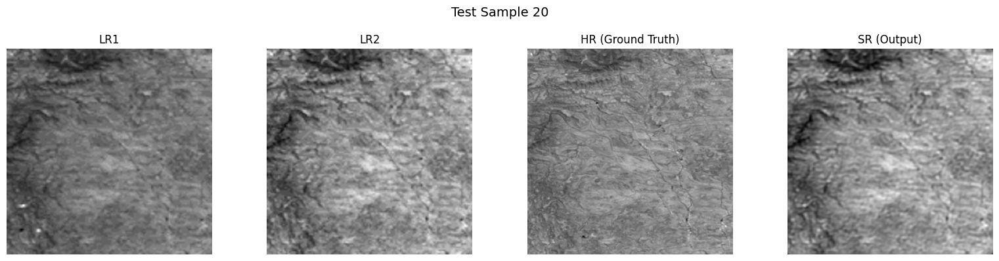

In [ ]:
show_comparison_with_gt(model, test_loader, num_samples=20)


In [ ]:
model.load_state_dict(torch.load("/content/checkpoints/best_model_epoch_50.pt", map_location=device))
model.eval()

DualSRCNN(
  (conv1): SRCNNExtractor(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
      (1): ReLU(inplace=True)
    )
  )
  (conv2): SRCNNExtractor(
    (conv): Sequential(
      (0): Conv2d(1, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
      (1): ReLU(inplace=True)
    )
  )
  (fusion): FusionBlock(
    (fuse): Sequential(
      (0): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
      (1): ReLU(inplace=True)
    )
  )
  (reconstruction): ReconstructionBlock(
    (reconstruct): Sequential(
      (0): Conv2d(32, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ReLU(inplace=True)
      (2): Conv2d(16, 1, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
  )
)

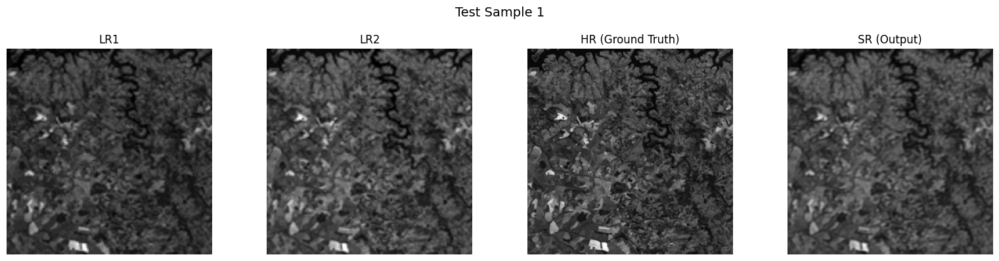

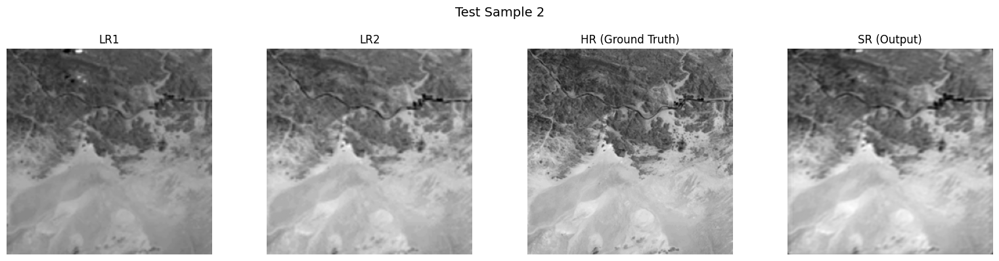

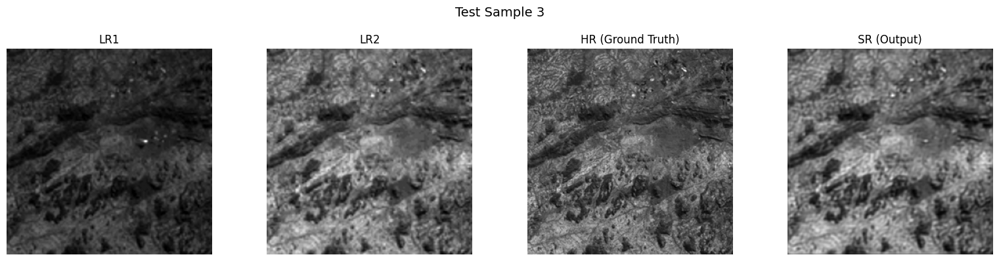

In [ ]:
show_comparison_with_gt(model, test_loader, num_samples=3)